In [672]:
import requests
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%

In [266]:
with open("brew_data_pages_1_to_200_backup.json.txt") as datajson:
    brew_data =json.load(datajson)

In [77]:
def get_all_info_brew(url, headers=False, page_lim=23): 
    data = []
    p = 1
    

    url = url
    key = 'e73f87f79c4072ed815427a00296ddde'
    while p <= page_lim:
        url_params = {
                        'key': key,
                        "withBreweries" : "Y",
                        "p": p
                    }
        data.append(requests.get(url,params=url_params).json())
        p += 1
    return data

In [78]:
#https://sandbox-api.brewerydb.com/v2/endpoint_name/?key=our_key

# url = "https://sandbox-api.brewerydb.com/v2/beers/?key=e73f87f79c4072ed815427a00296ddde/withBreweries=Y"
url = "https://sandbox-api.brewerydb.com/v2/beers/"

In [79]:
# brew_data = requests.get(get_all_info_brew(url))
brew_data_2 = get_all_info_brew(url, page_lim=2)

In [80]:
# brew_api = brew_data.json()
brew_data_2

[{'currentPage': 1,
  'numberOfPages': 23,
  'totalResults': 1109,
  'data': [{'id': 'c4f2KE',
    'name': "'Murican Pilsner",
    'nameDisplay': "'Murican Pilsner",
    'abv': '5.5',
    'glasswareId': 4,
    'styleId': 98,
    'isOrganic': 'N',
    'isRetired': 'N',
    'labels': {'icon': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-icon.png',
     'medium': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-medium.png',
     'large': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-large.png',
     'contentAwareIcon': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareIcon.png',
     'contentAwareMedium': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareMedium.png',
     'contentAwareLarge': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareLarge.png'},
    'status': 'verified',
    'statusDisplay': 'Verified',
    'createDate': '

In [81]:
brew_data_3 = get_all_info_brew(url, page_lim=23)

In [83]:
brew_data_3

[{'currentPage': 1,
  'numberOfPages': 23,
  'totalResults': 1109,
  'data': [{'id': 'c4f2KE',
    'name': "'Murican Pilsner",
    'nameDisplay': "'Murican Pilsner",
    'abv': '5.5',
    'glasswareId': 4,
    'styleId': 98,
    'isOrganic': 'N',
    'isRetired': 'N',
    'labels': {'icon': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-icon.png',
     'medium': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-medium.png',
     'large': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-large.png',
     'contentAwareIcon': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareIcon.png',
     'contentAwareMedium': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareMedium.png',
     'contentAwareLarge': 'https://brewerydb-images.s3.amazonaws.com/beer/c4f2KE/upload_jjKJ7g-contentAwareLarge.png'},
    'status': 'verified',
    'statusDisplay': 'Verified',
    'createDate': '

In [43]:
brew_data_2[0].keys()

dict_keys(['currentPage', 'numberOfPages', 'totalResults', 'data', 'status'])

In [45]:
brew_data_2[0]["status"]

'success'

In [ ]:
# structure main table

{
    "name" : str,
    "id" : str,
    "abv" : float(str),
    "isOrgnanic" : str,
    "isRetired" : str,
    "status" : str,
    "createDate" : str,
    "style" : dict, # look below
    "breweries" : list(dict) # look below category dict section
    
}

# structure of the style dict
{
    "id" : int,
    'category' : dict, # look below
    "name" : str,
    "shortName" : str,
    'ibuMin' : int(str),
    'ibuMax' : int(str),
    'abvMin' : int(str),
    'abvMax' : int(str),
    'srmMin' : int(str),
    'srmMax' : int(str),
    'ogMin' : int(str),
    'fgMin' : int(str),
    'fgMax' : int(str),
    
}
# structure of category dict
{
    "id" : int,
    "name" : str,
}

# brewery structure
{
    "id" : int,
    "name" : str,
    "established" : "datetime",
    "isVerified" : str,
    "locations" : list(dict) # see below
}

# location structure, iterate because of list
{
    "id" : str,
    "name" : str,
    "streetAddress" : str,
    'locality' : str,
    'region' : str,
    'postal' : str,
    "latitude" : float,
    "longitude" : float,
    "locationType" : str,
    "createDate" : str,
}

In [626]:
# def parse_data(data):
#     parsed_data = []
#         for information in data:
#             for business in information["businesses"]:
#                 parsed_dict = {}
#                 parsed_dict["business_name"] = business["name"]
#                 parsed_dict["address"] = (" ").join(business["location"]["display_address"])
#                 parsed_dict["phone"] = business["phone"]
#                 parsed_dict["transactions"] = business["transactions"]
#                 parsed_dict["rating"] = business["rating"]
#                 parsed_dict["review_count"] = business["review_count"]
#                 parsed_data.append(parsed_dict)
#         yelp_df = pd.DataFrame(data=parsed_data)

def small_parse(data_lst):
    style_lst = ["id", "name", "shortName", 'ibuMin','ibuMax', 'abvMin', 'abvMin','abvMax','srmMin', 'srmMax',
                 'ogMin','fgMin','fgMax' ]

    api_dict_list = []
    for index in range(len(data_lst)):
        for api_call in data_lst[index]["data"]:
            api_dict = {}
            api_dict["name"] = api_call["name"]
            if 'abv' in api_call:
                api_dict["abv"] = float(api_call["abv"])
            api_dict["organic?"] = api_call["isOrganic"]
            api_dict["retired?"] = api_call["isRetired"]
            api_dict["status"] = api_call["status"]
            api_dict["createDate"] = api_call["createDate"]
            if "style" in api_call:
                for style in style_lst:
                    if style in api_call["style"]:
                        api_dict[f"style_{style}"] = api_call["style"][style]
                api_dict["category_name"] = api_call["style"]["category"]["name"]
                api_dict["category_id"] = api_call["style"]["category"]["id"]
            brewery = api_call["breweries"][0]
            api_dict[f"brewery_name"] =  brewery["name"]
            api_dict[f"brewery_id"] = brewery["id"]
            if "established" in api_call["breweries"]:
                api_dict[f"established"] = brewery["established"]
            api_dict["brewery_locations_map"] = []
            api_dict["brewery_locations_name"] = []
            for idx in range(len(brewery["locations"])):
                brew_location = brewery["locations"][idx]
                api_dict["brewery_locations_name"].append(brew_location["name"])
                if "latitude" in brew_location and "longitude" in brew_location:
                    api_dict["brewery_locations_map"].append([float(brew_location["latitude"]),
                                                             float(brew_location["longitude"])])
            api_dict["number_of_locations"] = len(api_dict["brewery_locations_name"])
            
            api_dict_list.append(api_dict)
        


    return api_dict_list
    
working_data = small_parse(brew_data)

In [350]:
df = pd.DataFrame(working_data).set_index(["brewery_name","name"])
df.sort_index(inplace=True)

In [629]:
df_numeric = df.apply(pd.to_numeric, errors="ignore")

In [897]:
df_numeric.describe()

,abv,category_id,number_of_locations,style_abvMax,style_abvMin,style_fgMax,style_fgMin,style_ibuMax,style_ibuMin,style_id,style_ogMin,style_srmMax,style_srmMin
count,8663.000000,10000.000000,10000.000000,9071.000000,9064.000000,9000.000000,9000.000000,8838.000000,8477.000000,10000.000000,9007.000000,8841.000000,8850.000000
mean,7.001980,4.922700,1.613600,8.210964,5.126721,1.018899,1.010066,50.186241,29.030081,60.582100,1.052190,22.524941,10.898531
std,6.509305,3.288648,4.247882,4.148798,1.554172,0.006423,0.004994,25.210858,16.666054,41.671337,0.015679,19.830061,11.358821
min,0.050000,1.000000,1.000000,2.900000,0.500000,1.004000,0.992000,6.000000,3.000000,1.000000,1.008000,2.000000,1.000000
25%,5.200000,3.000000,1.000000,5.600000,4.000000,1.014000,1.006000,30.000000,18.000000,30.000000,1.044000,12.000000,4.000000
50%,6.430000,3.000000,1.000000,7.500000,4.800000,1.018000,1.010000,42.000000,25.000000,43.000000,1.048000,14.000000,6.000000
75%,8.100000,7.000000,1.000000,10.000000,6.300000,1.020000,1.012000,70.000000,45.000000,84.000000,1.060000,30.000000,11.000000
max,573.000000,14.000000,125.000000,33.000000,9.000000,1.040000,1.024000,100.000000,65.000000,173.000000,1.090000,100.000000,40.000000


In [795]:
df_num = df_numeric.groupby("style_name").count().sort_values(by="brewery_id", ascending=False)


In [895]:
df_num.describe()

,abv,brewery_id,brewery_locations_map,brewery_locations_name,category_id,category_name,createDate,number_of_locations,organic?,retired?,...,style_abvMin,style_fgMax,style_fgMin,style_ibuMax,style_ibuMin,style_id,style_ogMin,style_shortName,style_srmMax,style_srmMin
count,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,...,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000
mean,52.186747,60.240964,60.240964,60.240964,60.240964,60.240964,60.240964,60.240964,60.240964,60.240964,...,54.602410,54.216867,54.216867,53.240964,51.066265,60.240964,54.259036,60.240964,53.259036,53.313253
std,91.334391,104.575922,104.575922,104.575922,104.575922,104.575922,104.575922,104.575922,104.575922,104.575922,...,105.905268,106.041221,106.041221,106.288126,104.183122,104.575922,106.020920,104.575922,106.280471,106.255430
min,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,8.000000,8.250000,8.250000,8.250000,8.250000,8.250000,8.250000,8.250000,8.250000,8.250000,...,1.000000,1.000000,1.000000,0.000000,0.000000,8.250000,1.000000,8.250000,0.000000,0.000000
50%,23.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,...,22.000000,21.500000,21.500000,16.000000,15.000000,27.000000,21.500000,27.000000,16.000000,16.000000
75%,57.250000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,...,58.250000,58.250000,58.250000,55.500000,53.250000,62.000000,58.250000,62.000000,55.500000,55.500000
max,797.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,...,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000,883.000000


In [647]:
df.loc["Montauk Brewing Company"]

,abv,brewery_id,brewery_locations_map,brewery_locations_name,category_id,category_name,createDate,number_of_locations,organic?,retired?,...,style_fgMax,style_fgMin,style_ibuMax,style_ibuMin,style_id,style_name,style_ogMin,style_shortName,style_srmMax,style_srmMin
name,,,,,,,,,,,,,,,,,,,,,
Arrowhead Irish Red Ale,5.0,9zVaSj,"[[41.036641, -71.944036]]",[Main Brewery],2,Irish Origin Ales,2014-01-10 15:33:03,1,N,N,...,1.014,1.01,28,20,22,Irish-Style Red Ale,1.04,Irish Red,18,11


In [470]:
df_names_only = pd.DataFrame(df.reset_index().groupby("brewery_name").count()["name"])

In [481]:
x_val = df.reset_index().brewery_name.unique()

In [900]:
df_sort = df_names_only.sort_values("name", ascending=False)
df_sort[:10]

,name
brewery_name,
Mikkeller,102
Imperial Oak Brewing,77
Sierra Nevada Brewing Co.,74
Begyle Brewing,54
EPIC Brewing Company,48
Artisan's Brewery & Italian Grill,45
Three Floyds Brewing Company,44
Adnams Brewery,37
Stone Brewing,35


In [505]:
x_val[]

array(['101 Cider House', '105 West Brewing Co.', '11 Below Brewing', ...,
       'Überbrew', 'Černá Hora', 'афанасий'], dtype=object)

In [789]:
fig = plt.figure(figsize=(12, 12))
sns.barplot(x =list(df_sort.index[0:10]),y=df_sort[:10]["name"], palette='dark')
plt.title("Top 10 Brewery Beer Counts")
plt.xticks(rotation=20)

plt.xlabel("Brewery", fontweight="bold", color="blue")
plt.ylabel("Beer Count", fontweight="bold", color="blue")
# ax.set(xlabel="Brewery", ylabel="Beer Count")
plt.tight_layout()
plt.savefig("beer_count_by_brewer.png")

In [150]:
brew_data_3[21]["data"][49]["breweries"][0].keys()

dict_keys(['id', 'name', 'nameShortDisplay', 'description', 'website', 'established', 'isOrganic', 'images', 'status', 'statusDisplay', 'createDate', 'updateDate', 'isMassOwned', 'isInBusiness', 'isVerified', 'locations'])

In [63]:
bapi = brew_data_2[0]

In [101]:
bapi["data"][0]['style']['category']

{'id': 8, 'name': 'North American Lager', 'createDate': '2012-03-21 20:06:46'}

In [95]:
brew_data_3[0]["totalResults"]

1109

In [135]:
def count_breweries():
    cnt = []
    for i in range(22):
        for j in range(len(brew_data_3[i]["data"])):
            n = 1
            for brewery in brew_data_3[i]["data"][j]["breweries"]:
                cnt.append(n)
                n+=1
    return len(cnt)

In [136]:
count_breweries()

1101


In [251]:
def access_our_csv(filename, lst):
    df = pd.read_csv(filename)
    df = df.set_index(lst).sort_index()
    return df

In [252]:
df = open_our_csv("rv_beer_by_brewery_df.csv", ["breweries_name", "name"])

MultiIndex(levels=[['Anheuser-Busch InBev', 'Breckenridge Brewery', 'Brouwerij De Leite', 'Dock Street Brewery', 'Guinness', 'Harmon Brewing Company', 'Jackalope Brewing Company', 'Lagunitas Brewing Company', 'Last Name Brewing', 'Laughing Dog Brewing', 'Miller Brewing Company', 'New Holland Brewing Company', 'Oskar Blues Brewery', 'Portsmouth Brewery', 'Sierra Nevada Brewing Company', 'SweetWater Brewing Company', 'Wachusett Brewing Company', 'Zero Gravity Craft Brewery'], [''Murican Pilsner', '11.5° PLATO', '12th Of Never', '15th Anniversary Ale', '16 So Fine Red Wheat Wine', '1794 The Fergal Project', '17th Saison', '18th Anniversary Belgian Tripel', '19 - Golden Belgian Style Ale', '1904 American Red Lager', '2 x 4', '200th Anniversary Export Stout', '2017 Beer Camp', '20th Anniversary Imperial Hash IPA on Brett', '20th Street Ale Citra', '20th Street Ale Crystal', '20th Street Ale Magnum', '21st Anniversary', '25th Anniversary', '3 Weight', '30th Anniversary - Charlie, Fred & Ken'

In [242]:
d_org = {}
for ind in df.index:
    d_org.setdefault(ind[0], [])
    d_org[ind[0]].append(ind[1])
d_org

{'Sierra Nevada Brewing Company': ["'Murican Pilsner",
  '11.5° PLATO',
  '2 x 4',
  '2017 Beer Camp',
  '20th Street Ale Citra',
  '20th Street Ale Crystal',
  '20th Street Ale Magnum',
  '3 Weight',
  "30th Anniversary - Charlie, Fred & Ken's Bock",
  "30th Anniversary - Fritz and Ken's Ale",
  '30th Anniversary - Grand Cru',
  "30th Anniversary - Jack & Ken's Ale",
  "35th Anniversary  - Brewer's Reserve",
  'ABLE Best Britter',
  'Ale 20',
  'Alt Route - Beer Camp Across America',
  'Anniversary Ale',
  'Anniversary Ale 2007',
  'Anniversary Ale 2009',
  'Audition - Altbier',
  'Audition - Belgian-Style Blonde',
  'Audition - Belgian-Style Pale Ale',
  'Audition - Dark Ale',
  'Audition - Double IPA',
  'Audition - English-Style Bitter',
  'Audition - Imperial Pilsner',
  'Audition - Pale Ale',
  'Audition - Pilsner',
  'Audition - Rye Bock',
  'Audition - Scotch Ale',
  'Bad Luck Blonde',
  'Baltic Joy',
  'Barrel Aged Narwhal',
  'Barrel-Aged Bigfoot (Whiskey Barrels)',
  'Barrel

In [620]:
df.dtypes

abv                       float64
brewery_id                 object
brewery_locations_map      object
brewery_locations_name     object
category_id                 int64
category_name              object
createDate                 object
number_of_locations         int64
organic?                   object
retired?                   object
status                     object
style_abvMax               object
style_abvMin               object
style_fgMax                object
style_fgMin                object
style_ibuMax               object
style_ibuMin               object
style_id                    int64
style_name                 object
style_ogMin                object
style_shortName            object
style_srmMax               object
style_srmMin               object
dtype: object

In [217]:
!pip install folium
import folium
m = folium.Map(location=[45.5236, -122.6750])

In [649]:
map_ = folium.Map(location=[41.036641, -71.944036])
m = folium.CircleMarker(location=[41.036641, -71.944036], radius=6)
m.add_to(map_)
map_

In [272]:
def create_markers(map):
    map = folium.Map(location=[39.7246028, -100.8157154], zoom_start=2)
    count = 0
    loc_list_list = []
    for x in range(0, 200):
        for i in range(0, len(brew_list[x])):
            loc_list = []
            if ("breweries_locations_" + str(i+1) + "_latitude") in brew_list[x] and type(brew_list[x]["breweries_locations_" + str(i+1) + "_latitude"]) == float:
                loc_list.append(brew_list[x]["breweries_locations_" + str(i+1) + "_latitude"])
                loc_list.append(brew_list[x]["breweries_locations_" + str(i+1) + "_longitude"])
                marker = folium.CircleMarker(location = loc_list, radius = 6, color=clr)
                marker.add_to(m)
                loc_list_list.append(loc_list)
                count += 1
#             if count > 300:
#                 clr = "red"
    print(count)        
    return m

200

In [548]:
df.brewery_locations_map[1]

[[30.2234, -97.769736]]

In [616]:
def create_markers_set(dataframe):
    m = folium.Map(location=[39.7246028, -100.8157154], zoom_start=2, prefer_canvas=True,
                  disable_3d=True)
    name = None
    for i in range(10000):
        if dataframe.index[i][0] != name:
            name = dataframe.index[i][0]
            for loc in dataframe.brewery_locations_map[i]:
                marker = folium.CircleMarker(location = loc, radius = 1, color="#100783")
                marker.add_to(m)
    return m

In [892]:
df

abv  \
brewery_name              name                                             
#FREEDOM Craft Brewery    A Toast                                    NaN   
(512) Brewing Company     (512) ALT                                  6.0   
                          (512) Black IPA                            7.5   
                          (512) Bruin (A.K.A. Brown Bear)            7.6   
                          (512) CAB TRIPEL                           9.5   
                          (512) Cascabel Cream Stout                 6.0   
                          (512) Export Lager                         5.3   
                          (512) FIVE                                10.1   
                          (512) FOUR                                 7.5   
                          (512) IPA                                  7.0   
                          (512) ONE                                  8.0   
                          (512) Pale                                 6.0   
                          (512) Peach Sour                           6.2   
                          (512) SIX                                  7.5   
                          (512) Stingo                               7.5   
                          (512) THREE                                9.5   
                          (512) THREE (Cabernet Barrel Aged)         9.5   
                          (512) TWO                                  9.0   
                          (512) Whiskey Barrel Double Pecan Porter   9.5   
                          (512) White IPA                            5.3   
                          (512) Wild Bear                            8.5   
                          (512) Wit                                  5.1   
+351 Cerveja              351 Cerveja Pale Ale                       5.0   
10 Barrel Brewing Company "Mike Saw a Sasquatch" Session Ale         4.7   
                          10 Barrel OG. Wheat IPA                    6.5   
                          16 Barrels                                10.0   
                          2                                          7.5   
                          4                                          8.0   
                          86'd                                       6.5   
                          Allure                                     4.6   
...                                                                  ...   
belleville brewing        Balham Black                               4.6   
                          Battersea Brownstone                       4.8   
pFriem Family Brewers     Belgian Christmas Ale                      8.0   
                          Belgian Stout                             11.0   
                          Belgian Strong Blonde                      7.5   
                          Belgian Strong Dark                       10.0   
vyturio Alaus Darykla     1784 Anniversary Beer                      5.4   
                          Baltas Alus                                5.2   
À la Fût                  À La Belge Triple                          9.4   
Åbro Bryggeri             Åbro Original                              NaN   
Æblerov                   Alkmene                                    5.9   
                          Ananas                                     5.5   
                          Benene På Nakken                           5.9   
                          Både & #2                                  5.9   
                          Både& #1                                   5.9   
                          Både& #3                                   5.9   
Ægir Bryggeri             Altbier                                    4.7   
Überbrew                  ...Floor                                   6.6   
                          Alpha Force IPA                            7.7   
                          Alpha Force Tactical IPA                   7.8   
                          Alt 0220       

In [893]:
df.describe()

,abv,category_id,number_of_locations,style_id
count,8663.000000,10000.000000,10000.000000,10000.000000
mean,7.001980,4.922700,1.613600,60.582100
std,6.509305,3.288648,4.247882,41.671337
min,0.050000,1.000000,1.000000,1.000000
25%,5.200000,3.000000,1.000000,30.000000
50%,6.430000,3.000000,1.000000,43.000000
75%,8.100000,7.000000,1.000000,84.000000
max,573.000000,14.000000,125.000000,173.000000


In [898]:
m = create_markers_set(df)

In [618]:
m.save("map.html")

In [619]:
df.corr()

,abv,category_id,number_of_locations,style_id
abv,1.000000,-0.018332,0.004016,-0.003016
category_id,-0.018332,1.000000,-0.005589,0.876732
number_of_locations,0.004016,-0.005589,1.000000,-0.005380
style_id,-0.003016,0.876732,-0.005380,1.000000


In [ ]:
display(HTML(iframe))

In [622]:
df[df]

AttributeError: 'Index' object has no attribute 'to_numeric'

In [903]:
sums = df.groupby(df.style_name).count()
sums_1 = pd.DataFrame(sums.brewery_id)
sums_1 = sums_1[sums_1["brewery_id"] > 200].sort_values(by="brewery_id",ascending=False)
# sums_1.plot(kind="bar",legend=None, title="Most Popular Beer Styles")

fig = plt.figure(figsize=(12, 12))
sns.barplot(x =list(sums_1.index),y=sums_1["brewery_id"], palette='dark')
plt.title("Top 10 Beer Styles")
plt.xticks(rotation=20)

plt.xlabel("Style Type", fontweight="bold", color="blue")
plt.ylabel("Style Count", fontweight="bold", color="blue")
# ax.set(xlabel="Brewery", ylabel="Beer Count")
plt.tight_layout()
# plt.show()
# plt.savefig("popular_beer_styles")

In [902]:
captain lawrence, bronx brewery, brooklyn lager,

SyntaxError: invalid syntax (<ipython-input-902-3e25c0856291>, line 1)

In [891]:
abv_df = df[df["style_name"] == "American-Style India Pale Ale"].sort_values("abv")
abv_df

abv  \
brewery_name                            name                                                   
Thirsty Dog Brewing Company             Ankle Biter                                     4.00   
Short's Brewing Company                 Ale La Reverend                                 4.00   
32 North Brewing Co.                    Best Coast                                      4.10   
Avery Brewing Company                   4Point2                                         4.20   
Tired Hands Brewing Company             Adult Menu                                      4.30   
The Brew Kettle, Taproom and Smokehouse Awesome IPL                                     4.50   
Abita Brewing Company                   Big Easy with Ginger                            4.50   
                                        Big Easy                                        4.50   
Rapscallion Brewery & Tap Room          Azacca                                          4.50   
Saugatuck Brewing Company               Backyard IPA                                    4.50   
Oliver Brewing Company                  Balls To The Wall                               4.50   
2SP Brewing Company                     ASAP IPA                                        4.50   
Old OX Brewery                          Alpha Ox                                        4.50   
Tapistry Brewing                        Bad Moon Horizon                                4.50   
Cranker's Brewery                       Big In Japan                                    4.50   
Coronado Brewing Company                Baby Idiot                                      4.50   
Just Beer Brewing Co.                   Anytime IPA                                     4.60   
Gonzo's Biggdogg Brewing                Academy Slim Session IPA                        4.60   
Alpine Beer Company                     Babyface                                        4.70   
The Brew Kettle, Taproom and Smokehouse All For One IPA                                 4.75   
Adnams Brewery                          Adnams American-style IPA                       4.80   
Top Shelf Brewery                       Around the Clock                                4.80   
Basic City Beer Co.                     Basic City Randall Beer                         5.00   
Big Sky Brewing                         Big Sky IPA                                     5.00   
Coronado Brewing Company                Admiral's IPA                                   5.00   
Invercargill Brewery                    B.Man IPA                                       5.00   
Big Time Brewing Company                Bhagwan's Best IPA                              5.00   
Singlecut Beersmiths                    Billy 18-Watt IPA                               5.00   
Shipyard Brewing Company                American IPA                                    5.00   
Invercargill Brewery                    B.Man APA                                       5.00   
...                                                                                      ...   
Red Hare Brewing Company                Barrel Aged Gangway IPA                          NaN   
Rock Art Brewery                        Belvedere Big IPA                                NaN   
Rock Harbor Brewing Company             Beacon IPA                                       NaN   
SandLot Brewery at Coors Field          Batters I-PA                                     NaN   
Sante Adairius Rustic Ales              831 IPA                                          NaN   
Scantic River Brewery                   Billy Goat Trail Ale                             NaN   
Scarlet Lane Brewing Company            Absolem                                          NaN   
Silver Moon Brewing                     Alpha Project #4: Nelson the Spacefish Rye IPA   NaN   
SoMe Brewing Company                    Apostrophe                                       NaN   
Southern Prohibition Brewing            2014 IPA         

In [665]:
abv_df = pd.DataFrame(abv_df.abv)

In [852]:
df.index

MultiIndex(levels=[['#FREEDOM Craft Brewery', '(512) Brewing Company', '+351 Cerveja', '10 Barrel Brewing Company', '101 Cider House', '105 West Brewing Co.', '11 Below Brewing', '13 Virtues Brewing Co', '14 Hands Winery', '14th Star Brewing', '16 Mile Brewing Company', '180 And Tapped', '18th Street Brewery', '192 Brewing Company', '1933 Brewing Company', '1st Republic Brewing Co.', '2 Fools Cider', '2 Silos Brewing Co', '2 Tones Brewing Co.', '2 Towns Ciderhouse', '2 Way Brewing Company', '20 Corners Brewing', '21st Amendment Brewery', '23rd Street Brewery', '2SP Brewing Company', '2nd Shift Brewing Co', '2nd Story Brewing Company', '3 Beards Beer Company', '3 Daughters Brewing', '3 Freaks Brewery', '3 Guys and a Beer'd Brewing Company', '3 Nations Brewing Co.', '3 Sheeps Brewing Co', '3 Stars Brewing Company', '300 Suns Brewing', '32 North Brewing Co.', '33 Acres Brewing Company', '38 State Brewing Company', '3Cross Brewing Company', '4 Hands Brewing Company', '4 Noses Brewing Compa

In [689]:


sea_data = abv_df[pd.notna(abv_df["abv"])]
sea_data

abv
brewery_name                            name                                                     
Thirsty Dog Brewing Company             Ankle Biter                                          4.00
Short's Brewing Company                 Ale La Reverend                                      4.00
32 North Brewing Co.                    Best Coast                                           4.10
Avery Brewing Company                   4Point2                                              4.20
Tired Hands Brewing Company             Adult Menu                                           4.30
The Brew Kettle, Taproom and Smokehouse Awesome IPL                                          4.50
Abita Brewing Company                   Big Easy with Ginger                                 4.50
                                        Big Easy                                             4.50
Rapscallion Brewery & Tap Room          Azacca                                               4.50
Saugatuck Brewing Company               Backyard IPA                                         4.50
Oliver Brewing Company                  Balls To The Wall                                    4.50
2SP Brewing Company                     ASAP IPA                                             4.50
Old OX Brewery                          Alpha Ox                                             4.50
Tapistry Brewing                        Bad Moon Horizon                                     4.50
Cranker's Brewery                       Big In Japan                                         4.50
Coronado Brewing Company                Baby Idiot                                           4.50
Just Beer Brewing Co.                   Anytime IPA                                          4.60
Gonzo's Biggdogg Brewing                Academy Slim Session IPA                             4.60
Alpine Beer Company                     Babyface                                             4.70
The Brew Kettle, Taproom and Smokehouse All For One IPA                                      4.75
Adnams Brewery                          Adnams American-style IPA                            4.80
Top Shelf Brewery                       Around the Clock                                     4.80
Basic City Beer Co.                     Basic City Randall Beer                              5.00
Big Sky Brewing                         Big Sky IPA                                          5.00
Coronado Brewing Company                Admiral's IPA                                        5.00
Invercargill Brewery                    B.Man IPA                                            5.00
Big Time Brewing Company                Bhagwan's Best IPA                                   5.00
Singlecut Beersmiths                    Billy 18-Watt IPA                                    5.00
Shipyard Brewing Company                American IPA                                         5.00
Invercargill Brewery                    B.Man APA                                            5.00
...                                                                                           ...
Placerville Brewing Co                  Ale Dorado IPA                                       8.60
Anderson Valley Brewing Company         Anniversary Imperial IPA                             8.70
Rogue Ales                              8 Hop IPA                                            8.88
Stone Brewing                           20th Anniversary Encore Series: Stone 08.08.08 ...   8.90
Bear Republic Brewing Company           Apex                                                 8.95
Alpine Beer Company                     Bad Boy                                              9.00
Karl Strauss Brewing Company            Big Barrel Double IPA                                9.00
Marshall Wharf Brewing Company          Big Twitch IPA                                       9.00
One Trick Pony Brewing                  13 PSI                              

In [706]:
def sort_by_style_and_prop(dataframe, style_name, prop):
    sorted_df = dataframe[dataframe["style_name"] == style_name].sort_values(prop)
    sorted_df = pd.DataFrame(sorted_df[prop])
    sorted_df[pd.notna(sorted_df[prop])]
    return sorted_df

,,abv
brewery_name,name,


/Users/flatironschool/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/flatironschool/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Users/flatironschool/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/Users/flatironschool/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
/Users/flatironschool/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tup

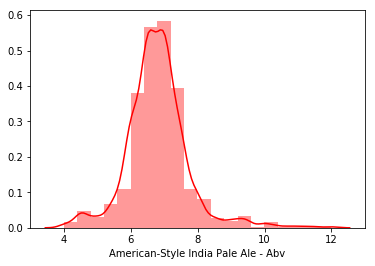

In [708]:
sns.distplot(sort_by_style_and_prop(df, "American-Style India Pale Ale", 'abv'), bins=20, axlabel="American-Style India Pale Ale - Abv", color="red" )

plt.savefig("American_Style_IPA_abv.png")


In [714]:

sort_by_style_and_prop(df, "American-Style India Pale Ale", 'abv')

style_ibuMin
brewery_name                          name                                               
(512) Brewing Company                 (512) IPA                                        50
One Trick Pony Brewing                13 PSI                                           50
Orange Blossom Brewing Company        Back in the Day I.P.A.                           50
Orpheus Brewing                       Ascending                                        50
Oskar Blues Brewery                   Bayside Black IPA                                50
Other Half Brewing Company            Amarillo IPA                                     50
Otter Creek Brewing                   Backseat Berner                                  50
                                      Black IPA                                        50
Oyster City Brewing Company           Apalach IPA                                      50
P3Brewing Company                     50 Nodi                                          50
Pabst Brewing Company                 Ballantine IPA                                   50
Packinghouse Brewing Company          Alpha IPA                                        50
Pact Beer Co.                         100 Acres IPA                                    50
Pale Fire Brewing Co.                 Arrant IPA                                       50
Paradise Creek Brewery                Alpha Madness                                    50
Paradox Brewery                       Beaver Bite                                      50
Parrotdog                             BitterBitch                                      50
Paw Paw Brewing Company               2 Paws IPA                                       50
Pelican Brewing Company               Beak Bender                                      50
People's Brewing Company              Amazon Princess IPA                              50
Perrin Brewing Company                98 Problems (Cuz a Hop Ain't One)                50
                                      Bitter Shadow                                    50
Persimmon Hollow Brewing Co.          Beach Hippie                                     50
Phantom Ales and Ciders               B42 IPA                                          50
One Barrel Brewing                    Bilbo Baggins                                    50
Omnipollo                             Beglo                                            50
                                      Aurora                                           50
                                      Astral                                           50
Nowhere In Particular Brewing Company Batch 012: Chance of Rain                        50
                                      Batch 027: Old School / New School IPA           50
...                                                                                   ...
Forgotten Boardwalk Brewing           Barrel Aged Mr. Watson                           50
Chapman Crafted Beer                  Apricocious                                      50
Florida Beer Company                  321                                              50
Finger Lakes Beer Company             11/11 India Pale Ale                             50
Eagle Creek Brewing Company           Adaptation IPA                                   50
Earnest Brew Works                    Beer Pressure                                    50
Earth Eagle Brewings                  Ancestral                                        50
East End Brewing Company              Big Hop Harvest Ale                              50
                                      Big Hop IPA                                      50
Ecliptic Brewing                      Arcturus India Pale Ale                          50
Eight & Sand Beer Co.                 Black IPA                                        50
Elevator Brewing Company              380 IPA                                          50
Ellison Brewery and Spirits

ValueError: color kwarg must have one color per data set. 883 data sets and 1 colors were provided

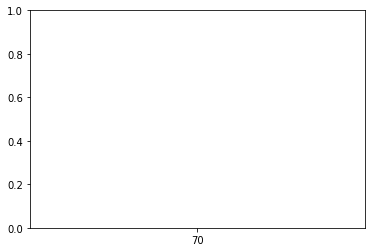

In [711]:
sns.distplot(sort_by_style_and_prop(df, "American-Style India Pale Ale", 'style_ibuMax'), bins=20, axlabel="American-Style India Pale Ale - IbuMax", color="blue")

plt.savefig("American_Style_IPA_ibuMax.png")



In [736]:
# all_abv_df = df[pd.notna(df.abv)]
# all_abv_df.abv.sort_values(ascending=False)
all_abv_df = df[df.abv < 100]
all_abv_df

abv  \
brewery_name              name                                             
(512) Brewing Company     (512) ALT                                  6.0   
                          (512) Black IPA                            7.5   
                          (512) Bruin (A.K.A. Brown Bear)            7.6   
                          (512) CAB TRIPEL                           9.5   
                          (512) Cascabel Cream Stout                 6.0   
                          (512) Export Lager                         5.3   
                          (512) FIVE                                10.1   
                          (512) FOUR                                 7.5   
                          (512) IPA                                  7.0   
                          (512) ONE                                  8.0   
                          (512) Pale                                 6.0   
                          (512) Peach Sour                           6.2   
                          (512) SIX                                  7.5   
                          (512) Stingo                               7.5   
                          (512) THREE                                9.5   
                          (512) THREE (Cabernet Barrel Aged)         9.5   
                          (512) TWO                                  9.0   
                          (512) Whiskey Barrel Double Pecan Porter   9.5   
                          (512) White IPA                            5.3   
                          (512) Wild Bear                            8.5   
                          (512) Wit                                  5.1   
+351 Cerveja              351 Cerveja Pale Ale                       5.0   
10 Barrel Brewing Company "Mike Saw a Sasquatch" Session Ale         4.7   
                          10 Barrel OG. Wheat IPA                    6.5   
                          16 Barrels                                10.0   
                          2                                          7.5   
                          4                                          8.0   
                          86'd                                       6.5   
                          Allure                                     4.6   
                          Amber Waves                                5.8   
...                                                                  ...   
Zipline Brewing Co.       Belgian Pale Ale                           6.5   
ZwanzigZ Pizza & Brewing  525                                        5.7   
belleville brewing        Balham Black                               4.6   
                          Battersea Brownstone                       4.8   
pFriem Family Brewers     Belgian Christmas Ale                      8.0   
                          Belgian Stout                             11.0   
                          Belgian Strong Blonde                      7.5   
                          Belgian Strong Dark                       10.0   
vyturio Alaus Darykla     1784 Anniversary Beer                      5.4   
                          Baltas Alus                                5.2   
À la Fût                  À La Belge Triple                          9.4   
Æblerov                   Alkmene                                    5.9   
                          Ananas                                     5.5   
                          Benene På Nakken                           5.9   
                          Både & #2                                  5.9   
                          Både& #1                                   5.9   
                          Både& #3                                   5.9   
Ægir Bryggeri             Altbier                                    4.7   
Überbrew                  ...Floor                                   6.6   
                          Alpha Force IPA                            7.7   
                          Alpha Force Tac

In [859]:
sns.distplot(all_abv_df.abv, bins=20, axlabel="ABV", color="#00ff55")
plt.title("All Beers", fontweight="bold")
plt.savefig("all_beers_abv.png")

In [862]:
sns.distplot(sea_data, bins=20, axlabel="ABV", color="red" )
plt.title("American-Style India Pale Ale", fontweight="bold")
plt.savefig("american_style_ipa_abv.png")





In [863]:
sea_data.describe()

,abv
count,797.00000
mean,6.79813
std,0.94057
min,4.00000
25%,6.30000
50%,6.80000
75%,7.20000
max,11.99000


In [866]:
all_beer_abv_overview = pd.DataFrame(all_abv_df.abv.describe())

,abv
count,8662.000000
mean,6.936638
std,2.320258
min,0.050000
25%,5.200000
50%,6.415000
75%,8.100000
max,26.100000


In [882]:
abv_df_imp = df[df["style_name"] == "Imperial or Double India Pale Ale"].sort_values("abv")
# abv_df_imp = abv_df_imp[pd.notna(abv_df_imp["abv"])]
abv_df_imp = abv_df_imp[pd.notna(abv_df_imp["abv"])]

In [886]:
sns.boxplot(sea_data, palette="dark" )
plt.title("American-Style India Pale Ale", fontweight="bold")


Text(0.5, 1.0, 'American-Style India Pale Ale')

In [885]:
sns.distplot(abv_df_imp.abv, bins=20, axlabel="ABV", color="green")
plt.title("Imperial or Double India Pale Ale", fontweight="bold")
plt.savefig("imperial_style_ipa_abv.png")

In [888]:
abv_df_imp_des = pd.DataFrame(abv_df_imp.abv.describe())

In [889]:
abv_df_imp_des

,abv
count,407.000000
mean,8.931843
std,1.287765
min,5.000000
25%,8.100000
50%,8.700000
75%,9.500000
max,18.000000


In [890]:
sea_data.describe()

,abv
count,797.00000
mean,6.79813
std,0.94057
min,4.00000
25%,6.30000
50%,6.80000
75%,7.20000
max,11.99000
